# Лабораторная работа №3. Синтез БИХ-фильтров




## Модуль 1. Метод размещения нулей и полюсов.


### Задача 1.1 Синтез цифрового резонатора

| Варианты: |   1 |    2 |    3 |    4 |    5 |    6 | 
|:---------:|----:|-----:|-----:|-----:|-----:|-----:|
|  $\nu_0$  | 0.25 | 0.2 | 0.1 |  — | — | — |
|$\theta_0$ | — | — | — | $\dfrac\pi6$ | $\dfrac\pi3$ | $\dfrac\pi2$ |

Синтезировать методом размещения нулей и полюсов цифровой резонатор для частоты $\nu_0$ или $\theta_0$ (в зависимости от варианта). Параметр, влияющий на добротность резонатора, подобрать самостоятельно.

* Построить нуль-полюсную диаграмму получившегося фильтра.
* Записать передаточную функцию $H(z)$.
* Вычислить аналитически импульсную и переходную характеристики и сравнить с результатами моделирования.
* Исследовать фильтр на устойчивость по входу.
* Изобразить блок-схему фильтра.
* Построить АЧХ и ФЧХ фильтра.
* Сравнить АЧХ с $H(z)$.

0.007792936291951547


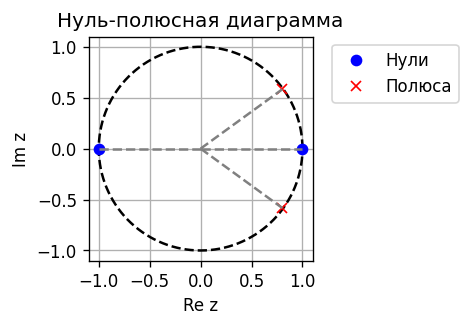

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal


nu0 = 0.1
beta, alpha = signal.iirpeak(nu0, Q=40, fs=1)
z, p, k = signal.tf2zpk(beta, alpha)
print (k)

plt.figure(figsize=[4, 4], dpi=120)
# unit circle
t = np.linspace(0, 2*np.pi, 401)
plt.plot(np.cos(t), np.sin(t), 'k--') # plot circle  

plt.plot(z.real, z.imag, 'bo', label='Нули')
plt.plot(p.real, p.imag, 'rx', label='Полюса')

for u in z:
  plt.plot([0, u.real], [0, u.imag],  '--', color='gray') # plot lines to zeros

for u in p:
  plt.plot([0, u.real], [0, u.imag],  '--', color='gray') # plot lines to poles

plt.yticks(np.linspace(-1, 1, 5))
plt.xticks(np.linspace(-1, 1, 5))

plt.grid()
plt.axis('image')
plt.axis([-1.1, 1.1, -1.1, 1.1])
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, numpoints=1)
plt.title("Нуль-полюсная диаграмма")

plt.xlabel("Re z")
plt.ylabel("Im z")

plt.tight_layout()


$$H(z) = \frac{(z - 1) (z + 1)}{(z - a \exp(2 \pi j \nu_0))(z - a \exp(- 2 \pi j \nu_0)) }$$

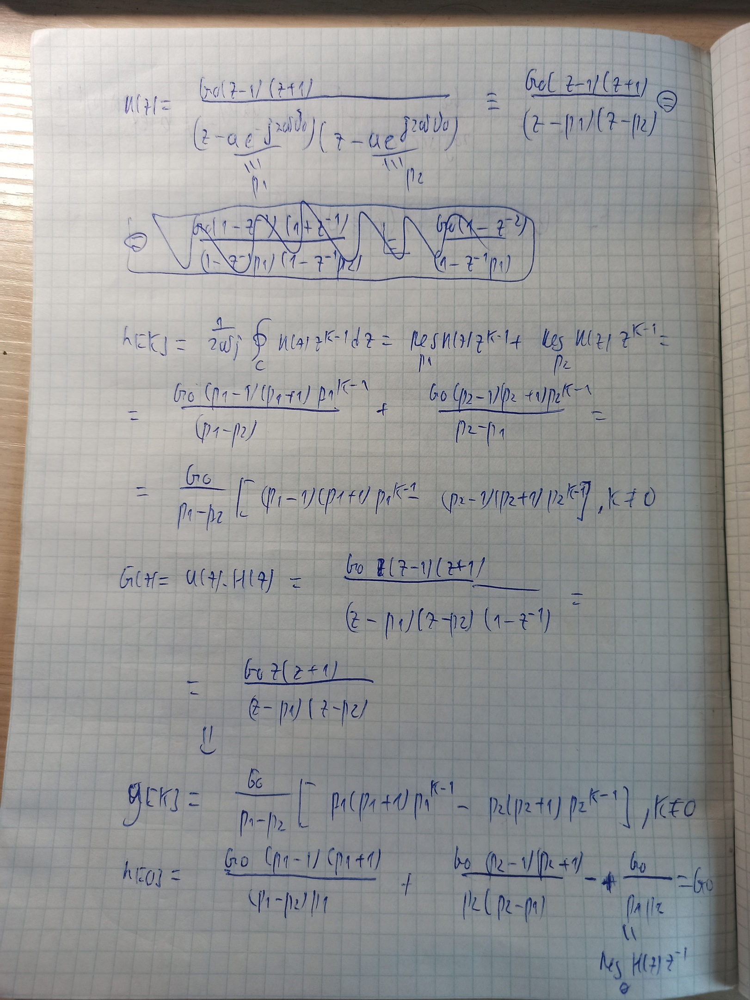

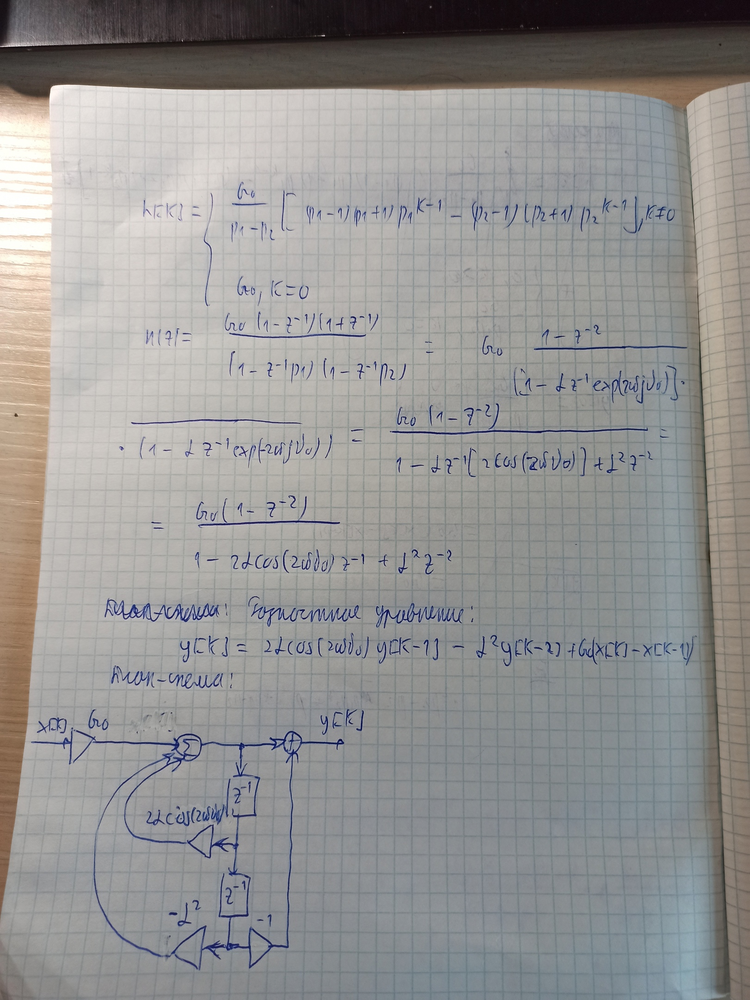

In [ ]:
def get_h (p1, p2, G0, k):
  if k == 0:
    return G0
  first_part = G0 / (p1 - p2)
  second_part = (p1 - 1) * (p1 + 1) * p1**(k - 1) - (p2 - 1) * (p2 + 1) * p2**(k - 1)
  return first_part * second_part

def get_g (p1, p2, G0, k):
  first_part = G0 / (p1 - p2)
  second_part = p1 * (p1 + 1) * p1**(k - 1) - p2 * (p2 + 1) * p2**(k - 1) 
  return first_part * second_part  

In [ ]:
p1 = p[0]
p2 = p[1]
G0 = k
N = 100

k_array = np.arange (N)
h_anal = np.array ([get_h (p1, p2, G0, k) for k in k_array])
g_anal = np.array ([get_g (p1, p2, G0, k) for k in k_array])


In [ ]:
system=signal.dlti(z, p, k, dt=1)
t, h_sim = signal.dimpulse(system, n=N)
t, g_sim = signal.dstep(system, n=N)
h_sim = h_sim[0].astype(complex)
h_sim = np.array ([h_sim[k][0] for k in range (N)])
g_sim = g_sim[0].astype(complex)
g_sim = np.array ([g_sim[k][0] for k in range (N)])

print (np.max (abs(h_anal - h_sim) / abs ((h_anal + h_sim) / 2)))
print (np.max (abs(g_anal - g_sim) / abs ((g_anal + g_sim) / 2)))


2.211511585424223e-14
2.0046173916289392e-14


Как видно, разница невелика

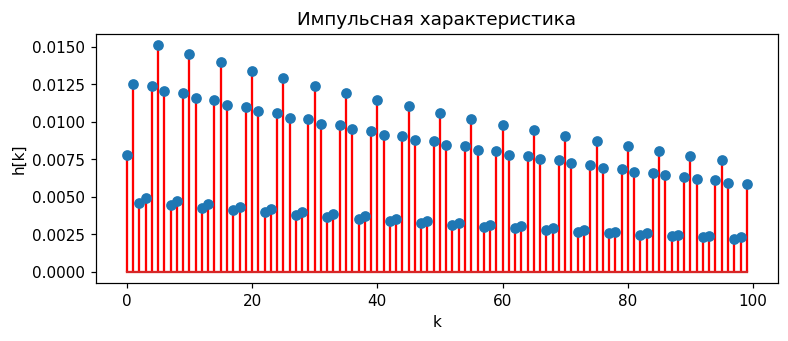

In [ ]:
plt.figure(figsize=[8, 3], dpi=110)
mdata_sim = plt.stem(t, abs (h_sim), use_line_collection=True, linefmt='-r')
plt.xlabel("k")
plt.ylabel("h[k]")
plt.title("Импульсная характеристика")
plt.show()

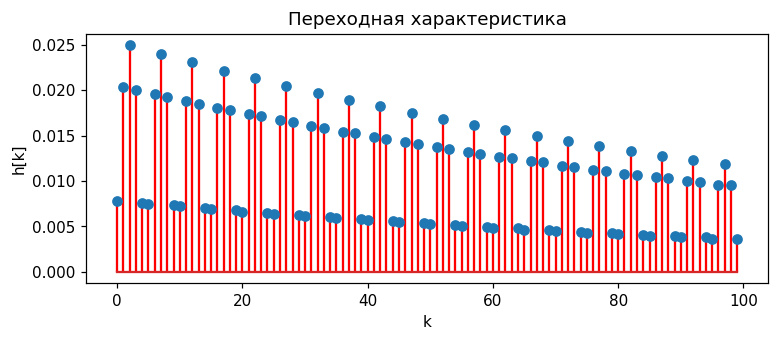

In [ ]:
plt.figure(figsize=[8, 3], dpi=110)
mdata_sim = plt.stem(t, abs (g_sim), use_line_collection=True, linefmt='-r')
plt.xlabel("k")
plt.ylabel("h[k]")
plt.title("Переходная характеристика")
plt.show()

Все полюса внутри единичного круга, поэтому фильтр устойчив по входу.

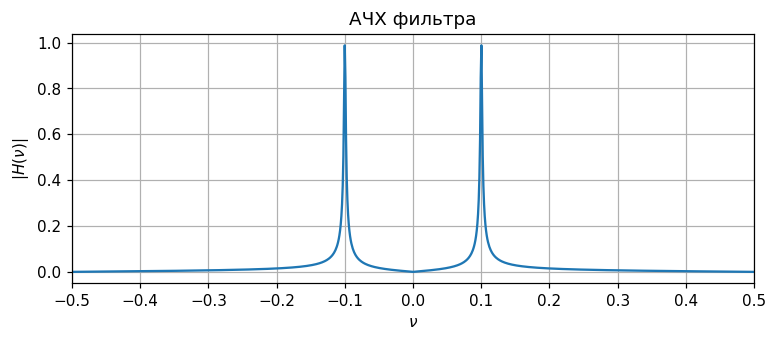

In [ ]:
w, H = signal.dfreqresp(system, w=np.linspace(-np.pi, np.pi, 1024))
plt.figure(figsize=[8, 3], dpi=110)
plt.plot(w/(2*np.pi), abs(H))
plt.xlabel("$\\nu$")
plt.ylabel("$|H(\\nu)|$")
plt.title("АЧХ фильтра")
plt.xlim([-0.5, 0.5])
plt.xticks(np.linspace(-0.5, 0.5, 11))
plt.grid()
plt.show()

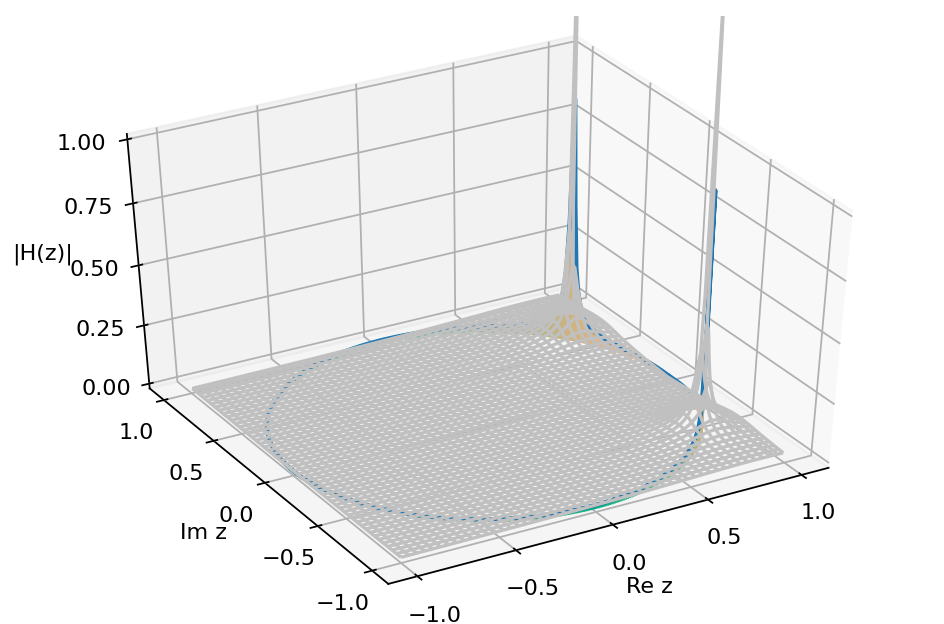

In [ ]:
fig = plt.figure(dpi=160)
ax = fig.gca(projection='3d')
Re=np.arange(-1, 1, 0.01)
Im=np.arange(-1, 1, 0.01)
Re, Im = np.meshgrid(Re, Im) # create rectangular grid
Z1=(Re+1j*Im)
Z=abs(G0 * (Z1 - 1) *(Z1 + 1) / ((Z1 - p1) * (Z1 - p2)))


phi=np.linspace(0, 2*np.pi, 500)
#ax.plot_surface(Re, Im, Z, linewidth=0, antialiased=True, color='silver')
ax.plot_wireframe(Re, Im, Z, color='silver')

phi=np.linspace(0, 2*np.pi, 500)
for u in phi:
  Z1=np.exp(-1j*u) # exponent
  Z2=abs(G0 * (Z1 - 1) *(Z1 + 1) / ((Z1 - p1) * (Z1 - p2))) #module 
  ax.plot([Z1.real, Z1.real], [Z1.imag, Z1.imag], [0.0, Z2],  color=(abs(np.cos(u)), 0.7, 0.5))


Z1=np.exp(-1j*phi)
Z2=abs(G0 * (Z1 - 1) *(Z1 + 1) / ((Z1 - p1) * (Z1 - p2)))

ax.plot(Z1.real, Z1.imag, Z2, linewidth=2) # create blue line on the top

ax.set_zlim(0,1)
ax.set_xticks(np.linspace(-1, 1, 5))
ax.set_yticks(np.linspace(-1, 1, 5))
ax.set_zticks(np.linspace(0, 1, 5))
ax.view_init(40, 240)
ax.set_xlabel("Re z")
ax.set_ylabel("Im z")

ax.zaxis.set_rotate_label(False)  # disable automatic rotation
ax.set_zlabel("|H(z)|", rotation=0)
plt.tight_layout()

Как видно, максимумы $H(z)$ находятся близ максимумов АЧХ. Только передаточная функция в максимуме уходит в бесконечность, так как там полюса, а в АЧХ конечные значения, так как мы специально выбирали полюча внутри единичного круга.

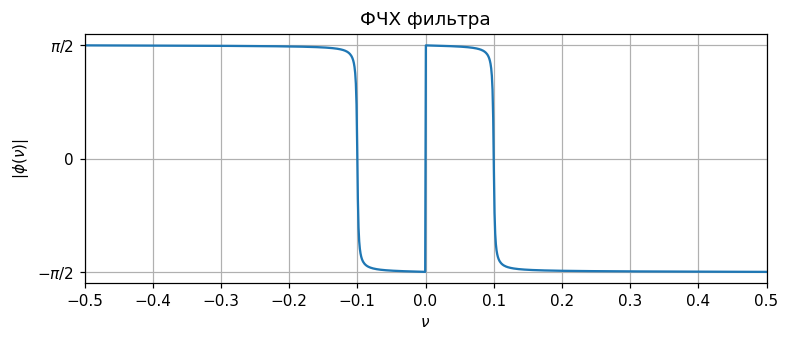

In [ ]:
plt.figure(figsize=[8, 3], dpi=110)
plt.plot(w/(2*np.pi),  np.angle(H))
plt.xlabel("$\\nu$")
plt.ylabel("$|\\phi(\\nu)|$")
plt.title("ФЧХ фильтра")
plt.xlim([-0.5, 0.5])
plt.xticks(np.linspace(-0.5, 0.5, 11))
plt.yticks([-np.pi/2, 0, np.pi/2], labels=("$-\\pi/2$", "0", "$\\pi/2$"))
plt.grid()
plt.show()

### Задача 1.2 Синтез цифрового фильтра Hum removal

| Варианты: |   1 |    2 |    3 |    4 |    5 |    6 | 
|:---------:|----:|-----:|-----:|-----:|-----:|-----:|
|  $f_0$, Гц  | 250 | 350 | 400 |  200 | 100 | 150 |
|  $f_д$, Гц | 1000 | 1000 | 1000 | 500 | 500 | 500 |

Синтезировать методом размещения нулей и полюсов цифровой фильтр Hum removal  для частоты $f_{0}$, $f_{д}$. Параметр, влияющий на добротность, подобрать самостоятельно.

* Записать передаточную функцию $H(z)$.
* Исследовать фильтр на устойчивость по входу.
* Изобразить блок-схему фильтра.
* Построить АЧХ и ФЧХ фильтра.
* Сравнить АЧХ с $H(z)$.


$$H(z)={{G}_{0}}\frac{\left( 1-\exp ({2 \pi j \frac {f_{0}}{f_д}}){{z}^{-1}} \right)\left( 1-\exp (-{2 \pi j \frac {f_{0}}{f_д}}){{z}^{-1}} \right)}{\left( 1-A\exp ({2 \pi j \frac {f_{0}}{f_д}}){{z}^{-1}} \right)\left( 1-A\exp (-{2 \pi j \frac {f_{0}}{f_д}}){{z}^{-1}} \right)}$$

Фильтр устойчивый по входу, так как все полюса внутри единичного круга

In [ ]:
f0 = 400
fs = 1000
nu0 = 0.1
beta, alpha = signal.iirnotch(f0, Q=30, fs=fs)
z, p, k = signal.tf2zpk(beta, alpha)
G0 = k
z1 = z[0]
z2 = z[1]
p1 = p[0]
p2 = p[1]

system=signal.dlti(z, p, k, dt=1)

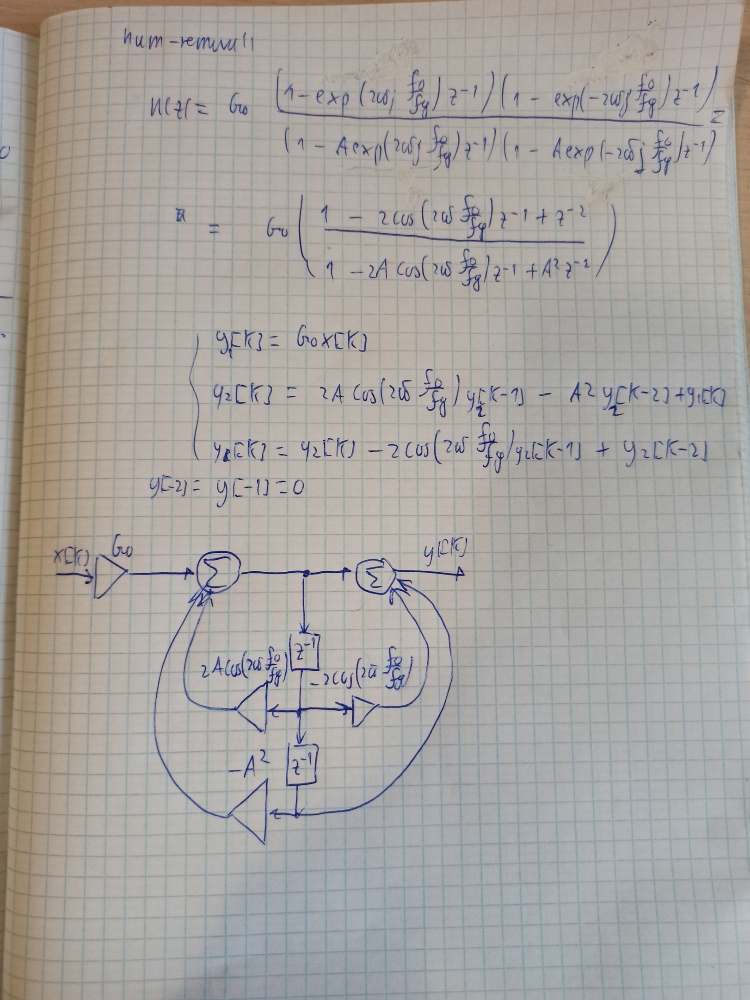

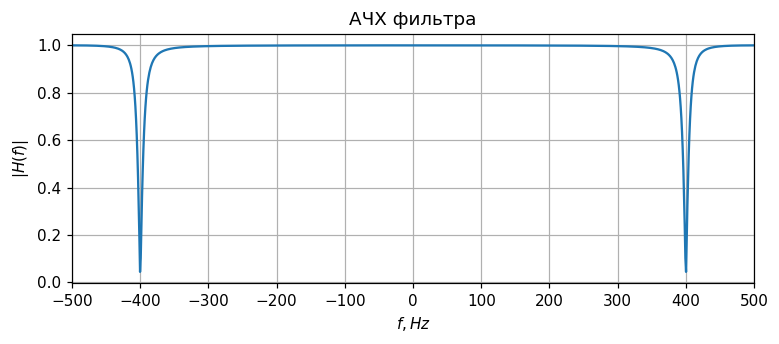

In [ ]:
w, H = signal.dfreqresp(system, w=np.linspace(-np.pi, np.pi, 1024))
plt.figure(figsize=[8, 3], dpi=110)
plt.plot(w * fs /(2*np.pi), abs(H))
plt.xlabel("$f, Hz$")
plt.ylabel("$|H(f)|$")
plt.title("АЧХ фильтра")
plt.xlim([-fs / 2, fs / 2])
plt.xticks(np.linspace(-fs / 2, fs / 2, 11))
plt.grid()
plt.show()

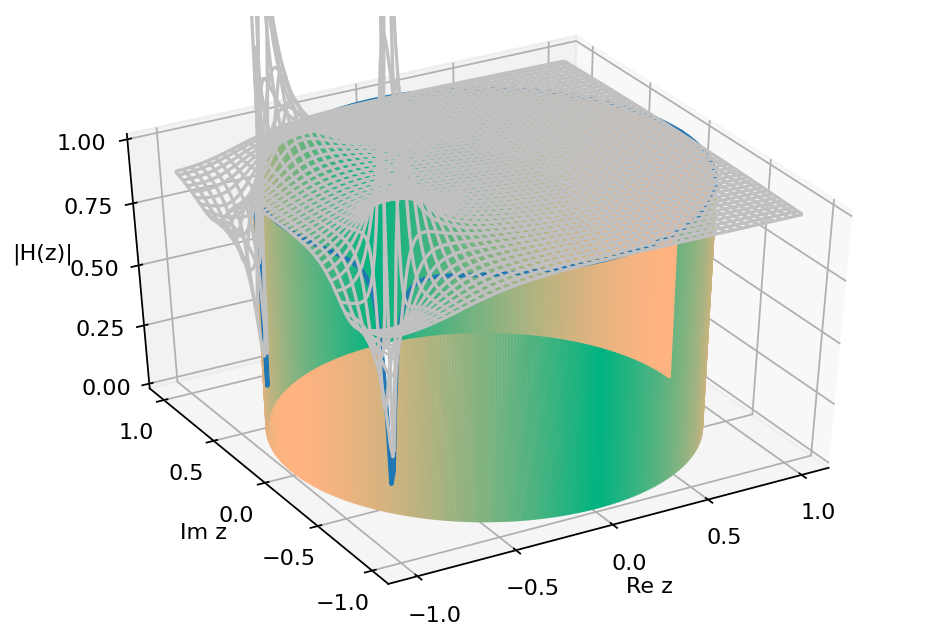

In [ ]:
fig = plt.figure(dpi=160)
ax = fig.gca(projection='3d')
Re=np.arange(-1, 1, 0.01)
Im=np.arange(-1, 1, 0.01)
Re, Im = np.meshgrid(Re, Im) # create rectangular grid
Z1=(Re+1j*Im)
Z=abs(G0 * (Z1 - z1) *(Z1 - z2) / ((Z1 - p1) * (Z1 - p2)))


phi=np.linspace(0, 2*np.pi, 500)
#ax.plot_surface(Re, Im, Z, linewidth=0, antialiased=True, color='silver')
ax.plot_wireframe(Re, Im, Z, color='silver')

phi=np.linspace(0, 2*np.pi, 500)
for u in phi:
  Z1=np.exp(-1j*u) # exponent
  Z2=abs(G0 * (Z1 - z1) * (Z1 - z2) / ((Z1 - p1) * (Z1 - p2))) #module 
  ax.plot([Z1.real, Z1.real], [Z1.imag, Z1.imag], [0.0, Z2],  color=(abs(np.cos(u)), 0.7, 0.5))


Z1=np.exp(-1j*phi)
Z2=abs(G0 * (Z1 - z1) * (Z1 - z2) / ((Z1 - p1) * (Z1 - p2)))

ax.plot(Z1.real, Z1.imag, Z2, linewidth=2) # create blue line on the top

ax.set_zlim(0,1)
ax.set_xticks(np.linspace(-1, 1, 5))
ax.set_yticks(np.linspace(-1, 1, 5))
ax.set_zticks(np.linspace(0, 1, 5))
ax.view_init(40, 240)
ax.set_xlabel("Re z")
ax.set_ylabel("Im z")

ax.zaxis.set_rotate_label(False)  # disable automatic rotation
ax.set_zlabel("|H(z)|", rotation=0)
plt.tight_layout()

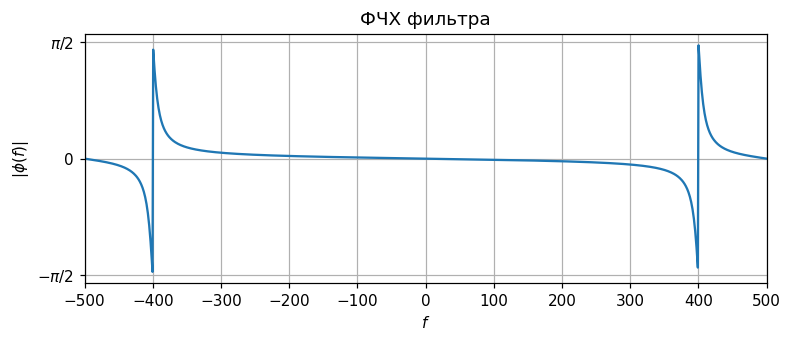

In [ ]:
plt.figure(figsize=[8, 3], dpi=110)
plt.plot(w * fs /(2*np.pi),  np.angle(H))
plt.xlabel("$f$")
plt.ylabel("$|\\phi(f)|$")
plt.title("ФЧХ фильтра")
plt.xlim([-fs / 2, fs / 2])
plt.xticks(np.linspace(-fs / 2, fs / 2, 11))
plt.yticks([-np.pi/2, 0, np.pi/2], labels=("$-\\pi/2$", "0", "$\\pi/2$"))
plt.grid()
plt.show()

Как видно, максимумы $H(z)$ находятся близ максимумов АЧХ и минимумы АЧХ совпадают с минимумами $H(z)$.

## Модуль 2. Метод билинейного z-преобразования

### Задача 2.1 Синтез фильтра нижних частот (ФНЧ)

| Варианты: |   1 |    2 |    3 |    4 |    5 |    6 | 
|:---------:|----:|-----:|-----:|-----:|-----:|-----:|
|  $f_д$, Гц  | 6000 | 6200 | 6400 |  6600 | 6800 | 7000 |
|  $f_1$, Гц | 800 | 860 | 920 | 980 | 1040 | 1100 |
|  $f_2$, Гц | 1100 | 1170 | 1240 | 1310 | 1380 | 1450 |
|  $a_\max$, дБ | 0.4455 | 0.4455 | 0.4455 | 0.4455 | 0.4455 | 0.4455 |
|  $a_\min$, дБ | 40 | 40 | 40 | 40 | 40 | 40 |

 Получить коэффициенты разностного уравнения БИХ-фильтра нижних частот со следующими характеристиками:
* частота дискретизации $f_{д}$, 
* граничная частота полосы пропускания $f_1$,
* граничная частота полосы задерживания $f_2$,
* максимальное допустимое затухание в полосе пропускания $a_\max$,
* минимальное допустимое затухание в полосе задерживания $a_\min$.

Воспользоваться методом билинейного z-преобразования для фильтров: 

1) Баттервота,

2) Чебышёва 1 рода,

3) Чебышёва 2 рода,

4) Золотарёва—Кауэра.

Из четырех получившихся результатов выбрать фильтр, обладающий наименьшим порядком $N$ и построить схему его реализации в виде каскада биквадратных блоков. Для биквадратных блоков выбрать прямую каноническую реализацию. 


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

fs=6400
f1=920
f2=1240
gpass=0.4455
gstop=40

min_H = pow (10, -gpass / 20)
max_H = pow (10, -gstop / 20)

In [ ]:
N, Wn = signal.buttord(wp=f1, ws=f2, gpass=gpass, gstop=gstop, analog=False, fs=fs)
beta, alpha = signal.butter(N, Wn=Wn, btype='lowpass', analog=False, output='ba', fs=fs)

16


In [ ]:
f, H = signal.freqz(beta, alpha, worN=np.linspace(-fs/2, fs/2, 1024**2), fs=fs)

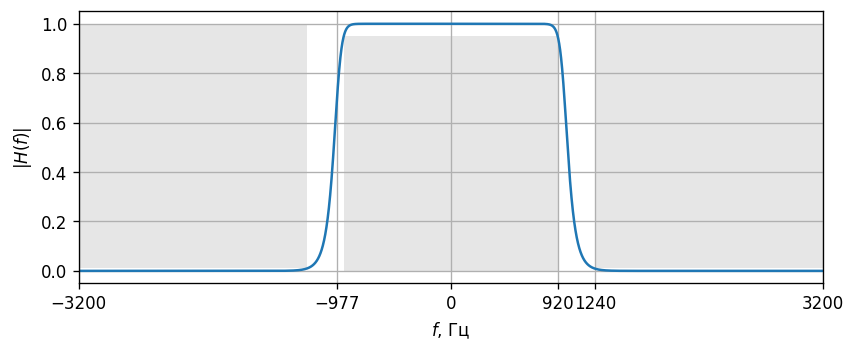

In [ ]:
plt.figure(figsize=[8, 3], dpi=120)
f, H = signal.freqz(beta, alpha, worN=np.linspace(-fs/2, fs/2, 1024**2), fs=fs)
plt.plot(f, (abs(H)))
plt.xlim([-fs/2, fs/2])
plt.xticks([-fs/2, -Wn, 0, f1, f2, fs/2])
plt.xlabel("$f$, Гц")
plt.ylabel("$|H(f)|$")
plt.fill([-f1,-f1, f1, f1], [0, min_H, min_H, 0], '0.9', lw=0)
plt.fill([-fs,-fs, -f2, -f2], [max_H, 1, 1, max_H], '0.9', lw=0)
plt.fill([fs,fs, f2, f2], [max_H, 1, 1, max_H], '0.9', lw=0)

plt.grid()

8


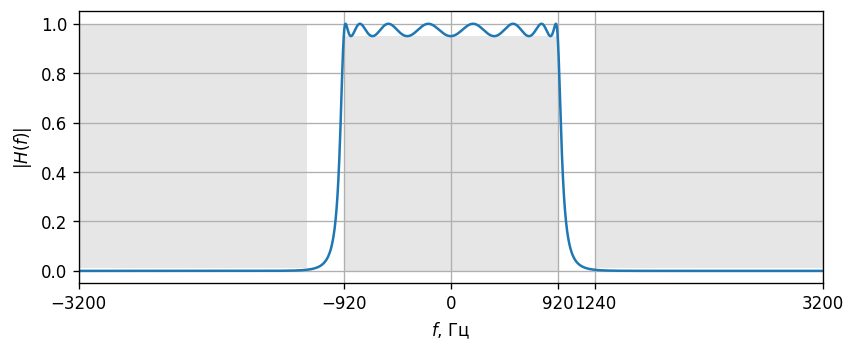

In [ ]:
N, Wn = signal.cheb1ord(wp=f1, ws=f2, gpass=gpass, gstop=gstop, analog=False, fs=fs)
beta, alpha = signal.cheby1(N, rp=gpass, Wn=Wn, btype='low', analog=False, output='ba', fs=fs)
print (N)

plt.figure(figsize=[8, 3], dpi=120)
f, H = signal.freqz(beta, alpha, worN=np.linspace(-fs/2, fs/2, 1024**2), fs=fs)
plt.plot(f, (abs(H)))
plt.xlim([-fs/2, fs/2])
plt.xticks([-fs/2, -Wn, 0, f1, f2, fs/2])
plt.xlabel("$f$, Гц")
plt.ylabel("$|H(f)|$")
plt.fill([-f1,-f1, f1, f1], [0, min_H, min_H, 0], '0.9', lw=0)
plt.fill([-fs,-fs, -f2, -f2], [max_H, 1, 1, max_H], '0.9', lw=0)
plt.fill([fs,fs, f2, f2], [max_H, 1, 1, max_H], '0.9', lw=0)

plt.grid()

8
0.9500030508739516


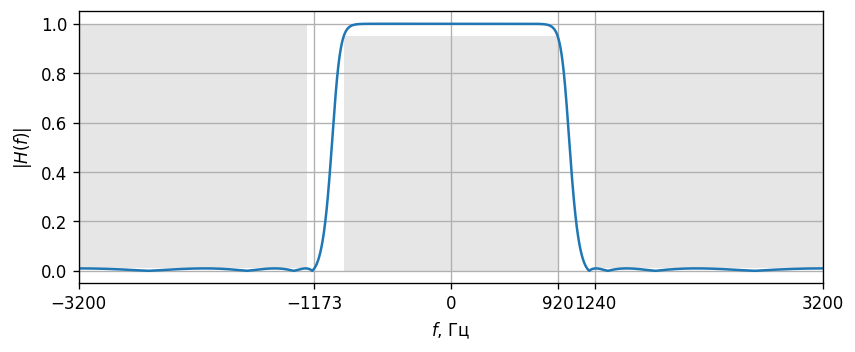

In [ ]:
N, Wn = signal.cheb2ord(wp=f1, ws=f2, gpass=gpass, gstop=gstop, analog=False, fs=fs)
beta, alpha = signal.cheby2(N, rs=gstop, Wn=Wn, btype='low', analog=False, output='ba', fs=fs)
print (N)

plt.figure(figsize=[8, 3], dpi=120)
f, H = signal.freqz(beta, alpha, worN=np.linspace(-fs/2, fs/2, 1024**2), fs=fs)
plt.plot(f, (abs(H)))
plt.xlim([-fs/2, fs/2])
plt.xticks([-fs/2, -Wn, 0, f1, f2, fs/2])
plt.xlabel("$f$, Гц")
plt.ylabel("$|H(f)|$")
print (min_H)
plt.fill([-f1,-f1, f1, f1], [0, min_H, min_H, 0], '0.9', lw=0)
plt.fill([-fs,-fs, -f2, -f2], [max_H, 1, 1, max_H], '0.9', lw=0)
plt.fill([fs,fs, f2, f2], [max_H, 1, 1, max_H], '0.9', lw=0)

plt.grid()

5
0.9500030508739516


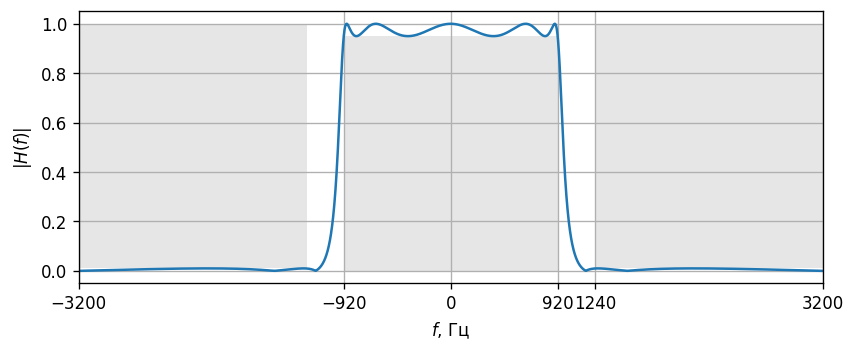

In [ ]:
N, Wn = signal.ellipord(wp=f1, ws=f2, gpass=gpass, gstop=gstop, analog=False, fs=fs)
beta, alpha = signal.ellip(N, rp=gpass, rs=gstop, Wn=Wn, btype='low', analog=False, output='ba', fs=fs)
print (N)

plt.figure(figsize=[8, 3], dpi=120)
f, H = signal.freqz(beta, alpha, worN=np.linspace(-fs/2, fs/2, 1024**2), fs=fs)
plt.plot(f, (abs(H)))
plt.xlim([-fs/2, fs/2])
plt.xticks([-fs/2, -Wn, 0, f1, f2, fs/2])
plt.xlabel("$f$, Гц")
plt.ylabel("$|H(f)|$")
print (min_H)
plt.fill([-f1,-f1, f1, f1], [0, min_H, min_H, 0], '0.9', lw=0)
plt.fill([-fs,-fs, -f2, -f2], [max_H, 1, 1, max_H], '0.9', lw=0)
plt.fill([fs,fs, f2, f2], [max_H, 1, 1, max_H], '0.9', lw=0)

plt.grid()

Наименьшее значение порядка равно $N = 5$. Оно достигается для фильтра Золоторёва-Кауэра.

In [ ]:
print (beta)
print (alpha)
signal.tf2sos(beta, alpha)

[2.81472260e-02 8.82195640e-05 3.20678191e-02 3.20678191e-02
 8.82195640e-05 2.81472260e-02]
[ 1.         -2.96052228  4.33099079 -3.55766775  1.64878635 -0.34098059]
[[ 0.02814723  0.02814723  0.          1.         -0.61964656  0.        ]
 [ 1.         -0.16334966  1.          1.         -1.1861951   0.61276065]
 [ 1.         -0.83351612  1.          1.         -1.15468062  0.89803806]]


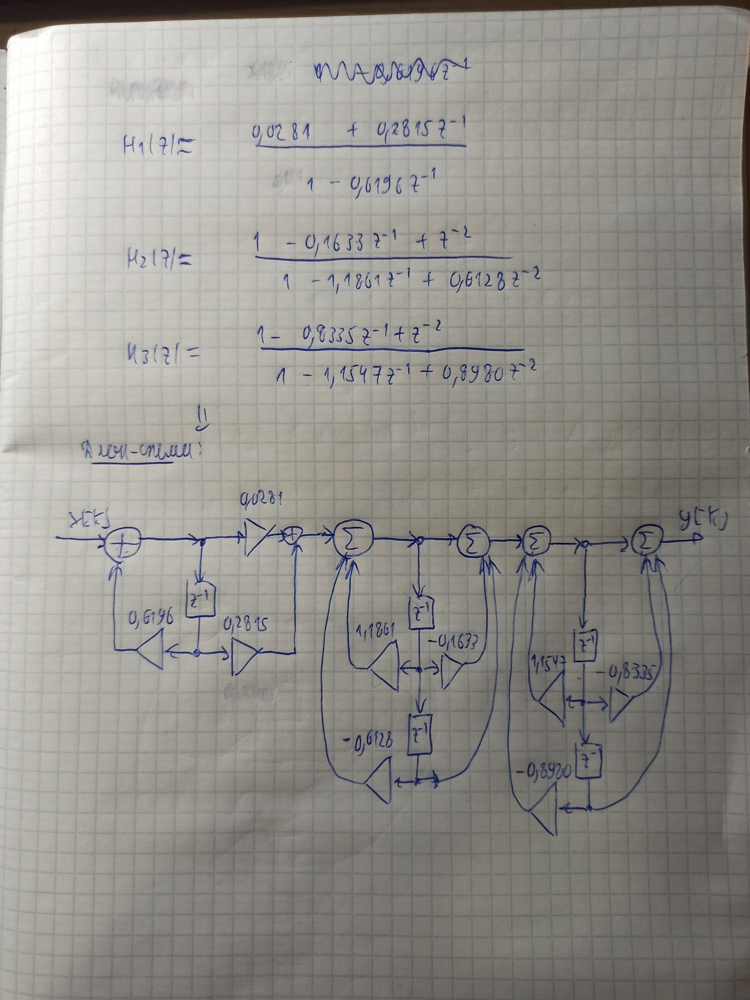

###Задача 2.2 Синтез аналога двухкаскадного RC-фильтра (I способ)

Построить БИХ фильтр, эквивалентный двум последовательно соединенным RC-цепочкам интегрирующего типа, воспользовавшись методом билинейного z-преобразования.

Параметры $RC$ и $\Delta t $ выбрать самостоятельно. 
Сравнить частотные и импульсные характеристики  цифровых фильтров и их аналоговых прототипов. 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal


RC=2*1e-4
dt=RC/2
lti_RC=signal.lti([1], [RC * RC, 2 * RC, 1])
beta, alpha = signal.bilinear([1], [RC * RC, 2 * RC, 1], 1 / dt)
dlti_RC=signal.dlti(beta, alpha, dt=dt)

w_a, H_a=signal.freqresp(lti_RC, w=np.linspace(-3*np.pi, 3*np.pi, 1024)/dt)
theta_d, H_d=signal.dfreqresp(dlti_RC, w=np.linspace(-3*np.pi, 3*np.pi, 1024))

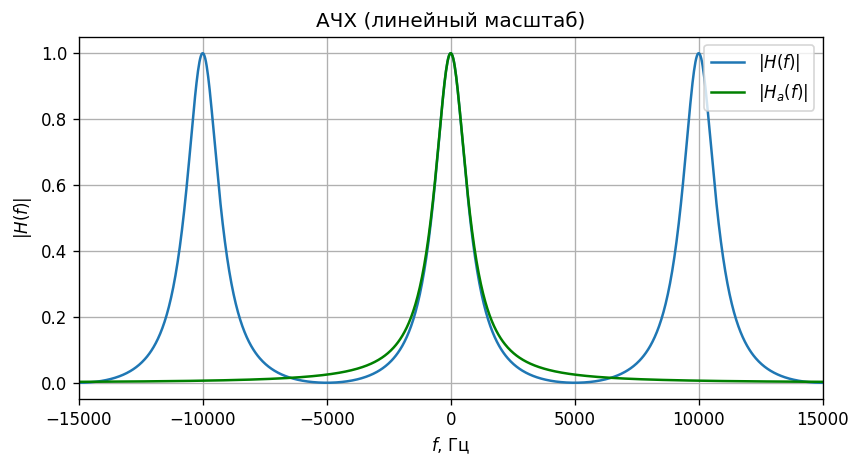

In [ ]:
plt.figure(figsize=[8, 4], dpi=120)
plt.plot(theta_d/(2*np.pi*dt), abs(H_d), label="$|H(f)|$")
plt.plot(w_a/(2*np.pi), abs(H_a), "g", label="$|H_a(f)|$")
plt.xlabel("$f$, Гц")
plt.ylabel("$|H(f)|$")
plt.title("АЧХ (линейный масштаб)")
plt.xlim([-1.5/dt, 1.5/dt])
plt.legend(loc='upper right')
plt.grid()

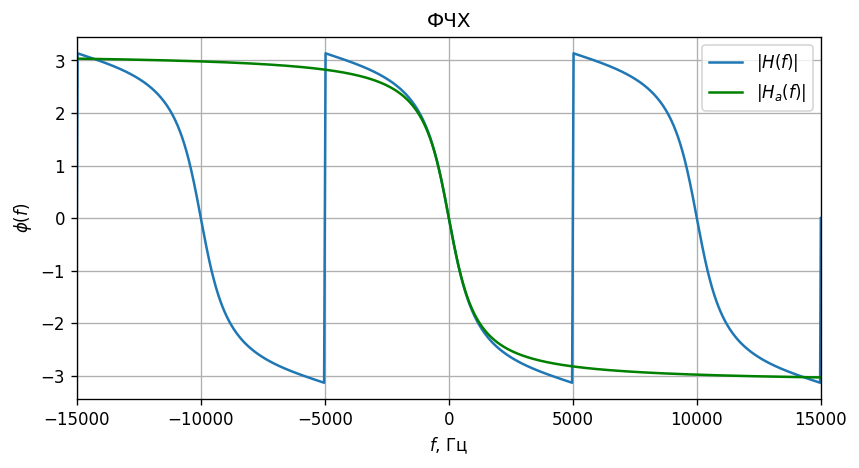

In [ ]:
plt.figure(figsize=[8, 4], dpi=120)
plt.plot(theta_d/(2*np.pi*dt), np.angle(H_d), label="$|H(f)|$")
plt.plot(w_a/(2*np.pi), np.angle(H_a), "g", label="$|H_a(f)|$")
plt.xlabel("$f$, Гц")
plt.ylabel("$\phi(f)$")
plt.title("ФЧХ")
plt.xlim([-1.5/dt, 1.5/dt])
plt.legend(loc='upper right')
plt.grid()

In [ ]:
N = 15

t, h = signal.dimpulse (dlti_RC, n=N)
ta, ha = signal.impulse (lti_RC, T=np.array ([dt * k for k in range (N)]))
h = [h[0][k][0] / dt for k in range (N)]

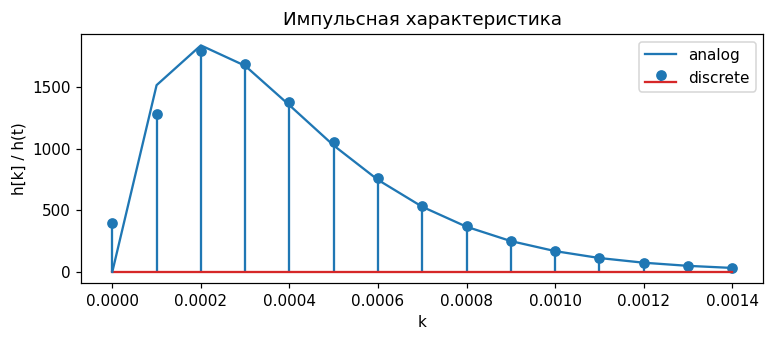

In [ ]:
plt.figure(figsize=[8, 3], dpi=110)
plt.stem(t, h, use_line_collection=True, label='discrete')
plt.plot(ta, ha, label='analog')
plt.xlabel("k")
plt.ylabel("h[k] / h(t)")
plt.title("Импульсная характеристика")
plt.legend(loc='upper right')
plt.show()

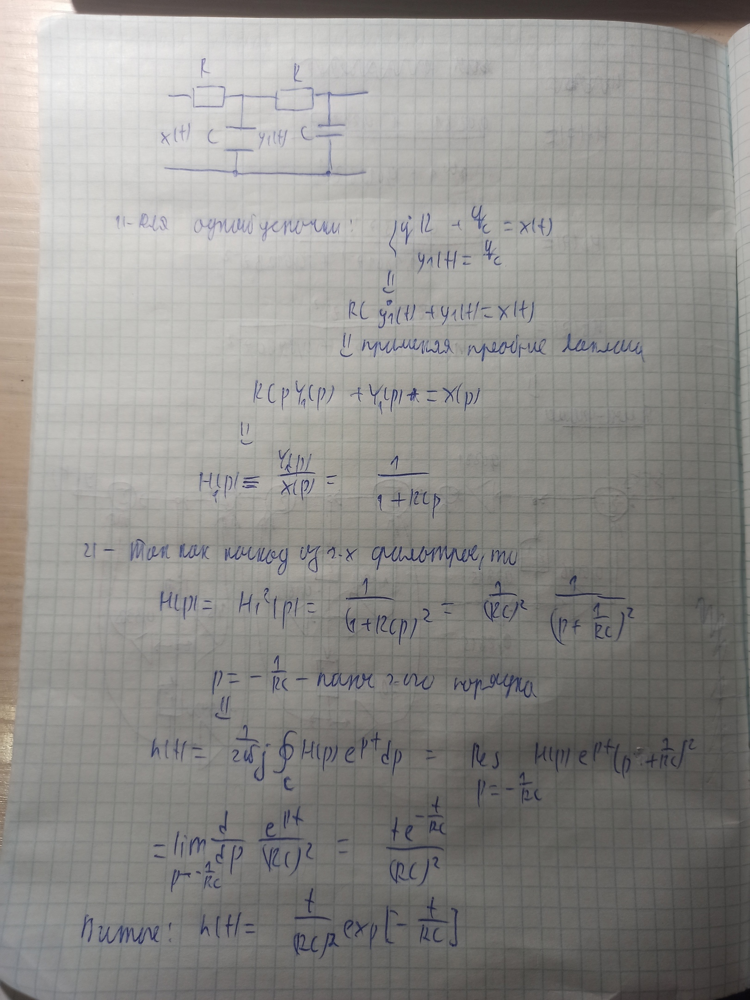

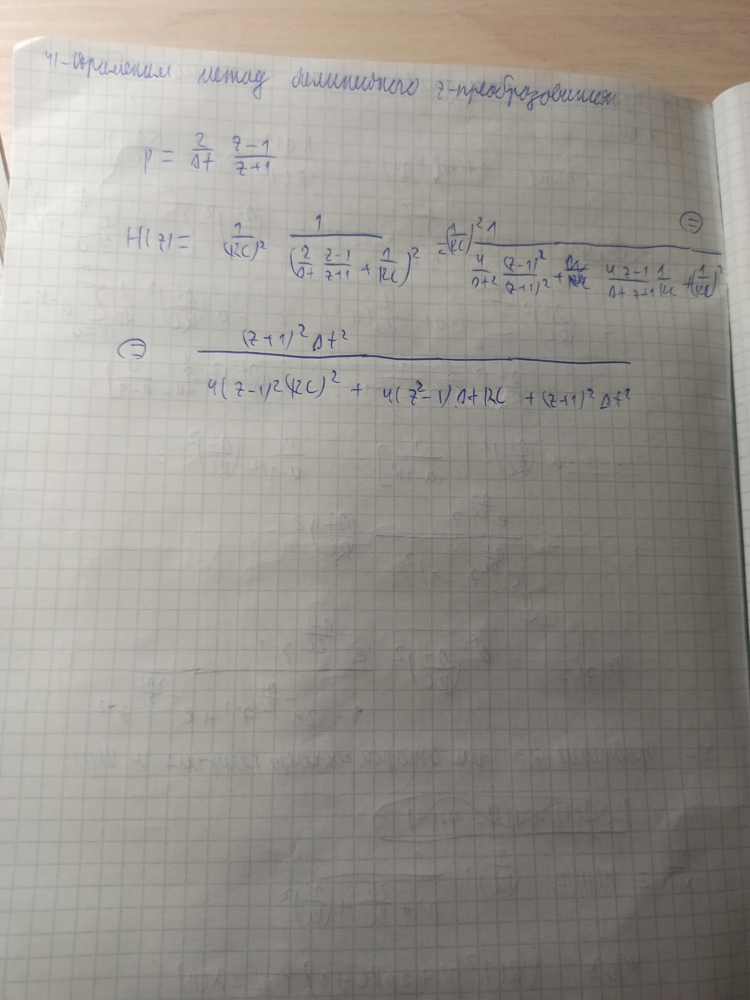

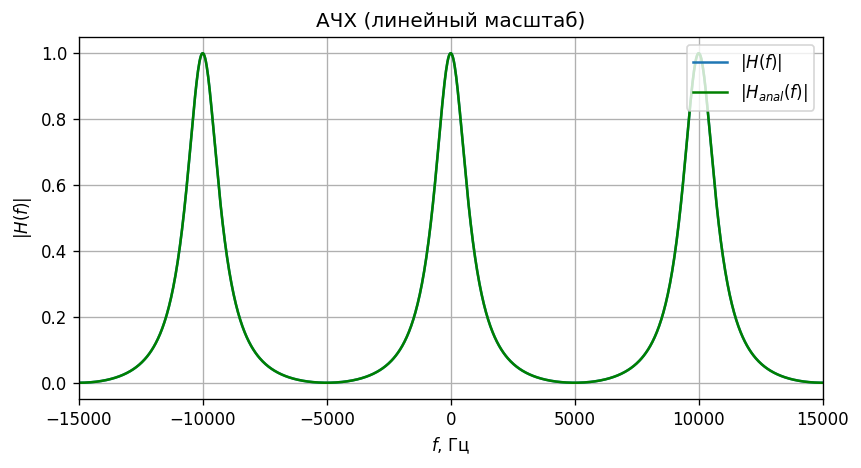

In [ ]:
def get_analytics_z (RC, dt, z):
  first_part = pow ((z + 1) * dt, 2) 
  second_part = pow (2 * (z - 1) * RC, 2) + 4 * (z * z - 1) * dt * RC + pow ((z + 1) * dt, 2)
  return first_part / second_part

def get_analytics_f (RC, dt, f):
  return get_analytics_z (RC, dt, np.exp (2 * np.pi * 1j * f * dt))


H_anal = np.array ([get_analytics_f (RC, dt, theta/(2*np.pi*dt)) for theta in theta_d])
plt.figure(figsize=[8, 4], dpi=120)
plt.plot(theta_d/(2*np.pi*dt), abs(H_d), label="$|H(f)|$")
plt.plot(theta_d/(2*np.pi*dt), abs(H_anal), "g", label="$|H_{anal}(f)|$")
plt.xlabel("$f$, Гц")
plt.ylabel("$|H(f)|$")
plt.title("АЧХ (линейный масштаб)")
plt.xlim([-1.5/dt, 1.5/dt])
plt.legend(loc='upper right')
plt.grid()



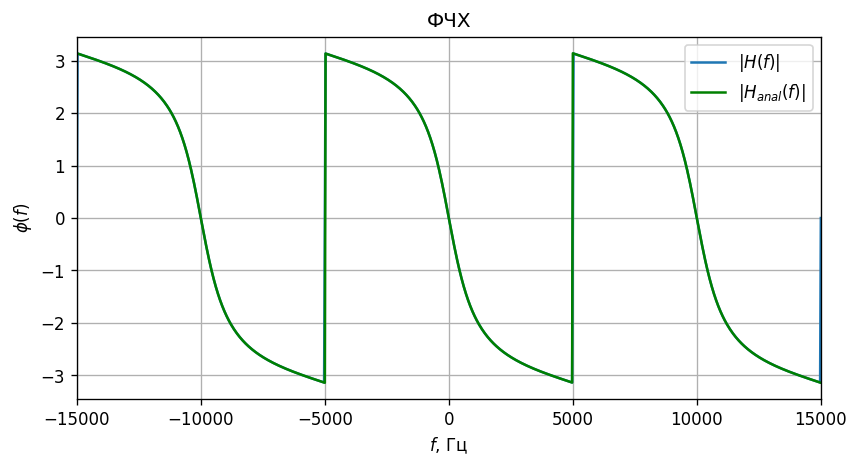

In [ ]:
plt.figure(figsize=[8, 4], dpi=120)
plt.plot(theta_d/(2*np.pi*dt), np.angle(H_d), label="$|H(f)|$")
plt.plot(theta_d/(2*np.pi*dt), np.angle(H_anal), "g", label="$|H_{anal}(f)|$")
plt.xlabel("$f$, Гц")
plt.ylabel("$\phi(f)$")
plt.title("ФЧХ")
plt.xlim([-1.5/dt, 1.5/dt])
plt.legend(loc='upper right')
plt.grid()

## Модуль 3. Метод инвариантной импульсной характеристики.

### Задача 3.1 Синтез аналога двухкаскадного RC-фильтра (II способ)

Построить БИХ фильтр, эквивалентный двум последовательно соединенным RC-цепочкам интегрирующего типа, воспользовавшись методом инвариантной импульсной характеристики.

Параметры $RC$ и $\Delta t $ выбрать самостоятельно. 
Сравнить частотные и импульсные характеристики  цифровых фильтров и их аналоговых прототипов. 

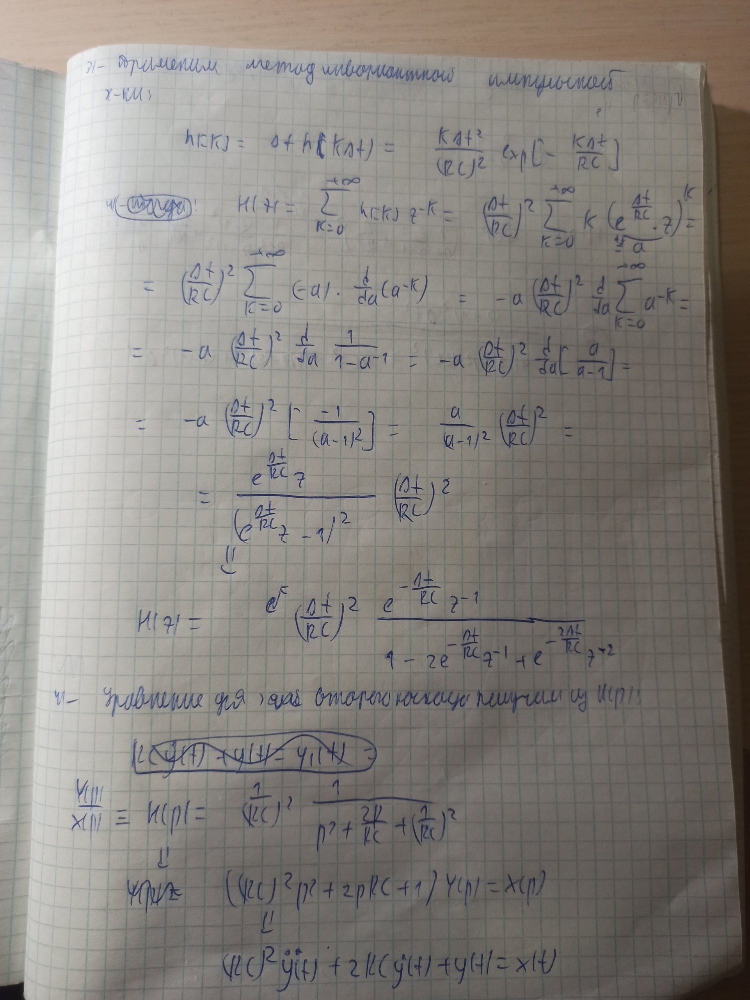

In [ ]:
def get_analytics_z2 (RC, dt, z):
  first_part = pow (-dt / RC, 2) 
  second_part = np.exp (-dt / RC) * z
  third_part = z * z - 2 * np.exp (-dt / RC) * z + np.exp (-2 * dt / RC)
  return first_part * second_part / third_part

def get_analytics_f2 (RC, dt, f):
  return get_analytics_z2 (RC, dt, np.exp (2 * np.pi * 1j * f * dt))

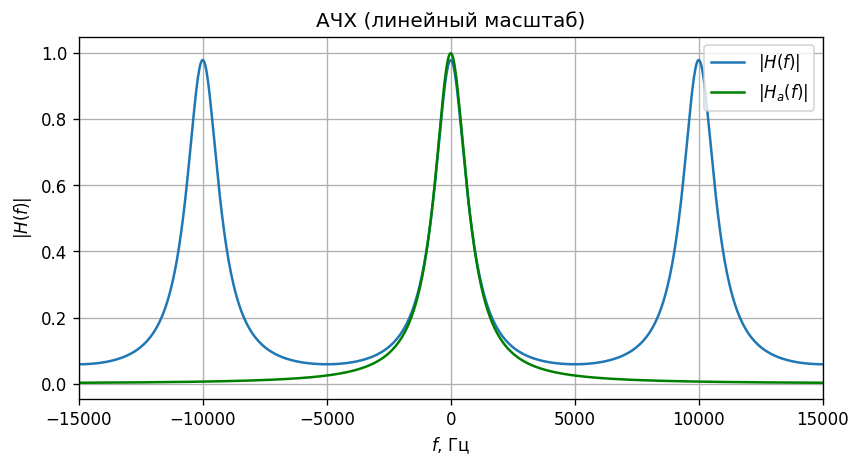

In [ ]:
lti_RC=signal.lti([1], [RC * RC, 2 * RC, 1])
w_a, H_a=signal.freqresp(lti_RC, w=np.linspace(-3*np.pi, 3*np.pi, 1024)/dt)
H_anal = np.array ([get_analytics_f2 (RC, dt, w/(2*np.pi)) for w in w_a])

plt.figure(figsize=[8, 4], dpi=120)
plt.plot(w_a/(2*np.pi), abs(H_anal), label="$|H(f)|$")
plt.plot(w_a/(2*np.pi), abs(H_a), "g", label="$|H_a(f)|$")
plt.xlabel("$f$, Гц")
plt.ylabel("$|H(f)|$")
plt.title("АЧХ (линейный масштаб)")
plt.xlim([-1.5/dt, 1.5/dt])
plt.legend(loc='upper right')
plt.grid()

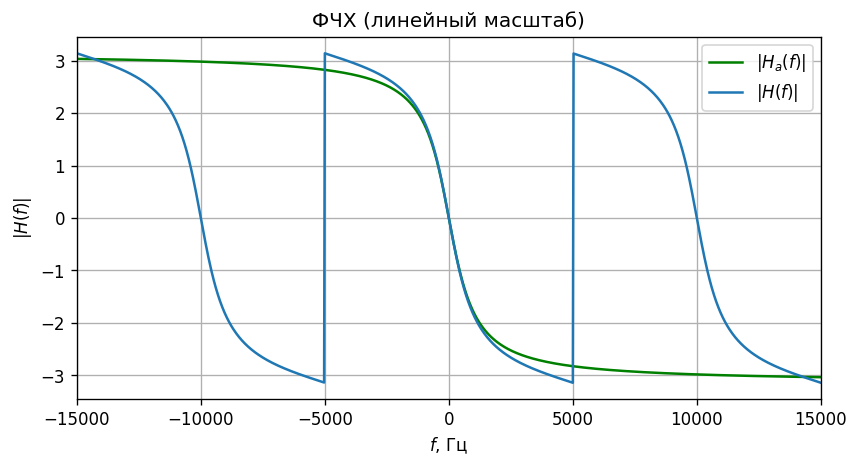

In [ ]:
plt.figure(figsize=[8, 4], dpi=120)
plt.plot(w_a/(2*np.pi), np.angle(H_a), "g", label="$|H_a(f)|$")
plt.plot(w_a/(2*np.pi), np.angle(H_anal), label="$|H(f)|$")
plt.xlabel("$f$, Гц")
plt.ylabel("$|H(f)|$")
plt.title("ФЧХ (линейный масштаб)")
plt.xlim([-1.5/dt, 1.5/dt])
plt.legend(loc='upper right')
plt.grid()

In [ ]:
N = 15

beta = [0, pow (dt / RC, 2) * np.exp (- dt / RC), 0]
alpha = [1, -2 * np.exp (-dt / RC), np.exp (-2 * dt / RC)]
dlti_RC=signal.dlti(beta, alpha, dt=dt)

t, h = signal.dimpulse (dlti_RC, n=N)
ta, ha = signal.impulse (lti_RC, T=np.array ([dt * k for k in range (N)]))
h = [h[0][k][0] / dt for k in range (N)]



/usr/local/lib/python3.7/dist-packages/scipy/signal/filter_design.py:1622: BadCoefficients: Badly conditioned filter coefficients (numerator): the results may be meaningless
  "results may be meaningless", BadCoefficients)


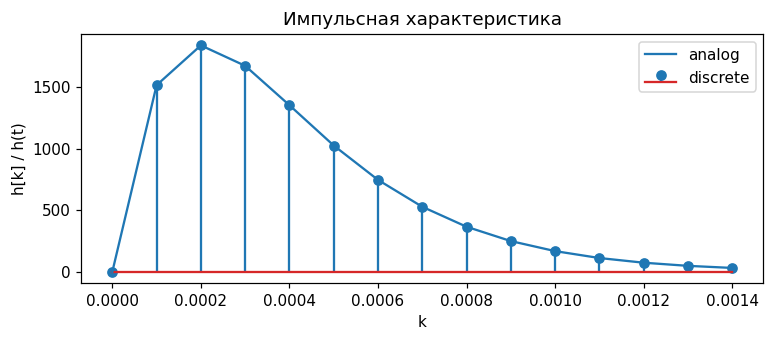

In [ ]:
plt.figure(figsize=[8, 3], dpi=110)
plt.stem(t, h, use_line_collection=True, label='discrete')
plt.plot(ta, ha, label='analog')
plt.xlabel("k")
plt.ylabel("h[k] / h(t)")
plt.title("Импульсная характеристика")
plt.legend(loc='upper right')
plt.show()

### Задача 3.2 Цифровая фильтрация реальных сигналов (творческая задача)

Выполнить фильтрацию `.wav` файла с помощью одного из цифровых фильтров, рассмотренных в первой и второй лабораторной работах. Проиллюстрировать, как в результате фильтрации изменился сигнал. Привести пример, для чего выбранный фильтр может быть применен. 

Для этой задачи `.wav` файл можно загрузить, например, с сайта [freesound.org](https://freesound.org/) или взять из предыдущих лабораторных работ.

In [ ]:
import scipy.io.wavfile
from IPython.display import Audio
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

f1=1000
f2=1200
gpass=0.4455
gstop=40
fs=3000

Audio('/content/sample_data/vibraphone.wav')

$rate = 44100 Hz; dT = 2.2675736961451248e-05 s$


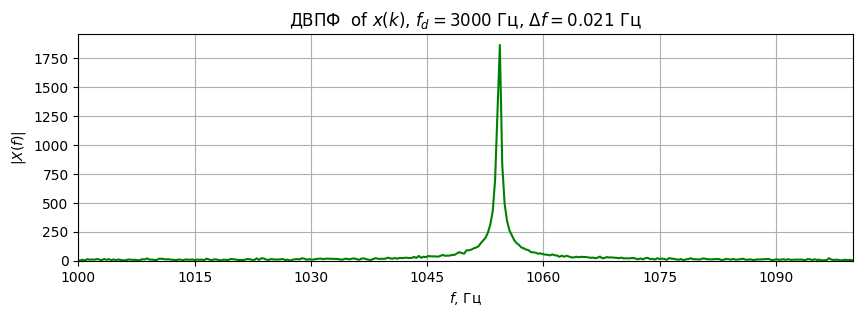

In [ ]:
rate, x1 = scipy.io.wavfile.read('/content/sample_data/vibraphone.wav')
x = np.array (x1) + np.random.normal(0, np.mean (abs (np.array (x1))), len (x1)) # +
print ("$rate = {} Hz; dT = {} s$".format (rate, 1 / rate))

plt.figure(figsize=[10, 3], dpi=100)
M = len (x)
plt.plot((-0.5 + (np.arange(M) / M)) * rate, 
         abs (np.fft.fftshift (np.fft.fft (x))) / M, 
         'g')

xmin = 1000
xmax = 1100
plt.axis(xmin = xmin, xmax = xmax, ymin=0)
plt.xticks([k for k in range (xmin, xmax, 15)])

plt.title(u'ДВПФ  of $x(k)$, $f_d=%d$ Гц, $\Delta f=%.3f$ Гц' %(fs, fs/M))
plt.xlabel(u'$f$, Гц')
plt.ylabel(u'$|X(f)|$')
plt.grid()

In [ ]:
x = x.astype('int16')
scipy.io.wavfile.write(filename='./track.wav', rate=rate, data=x)
Audio('./track.wav')


3000


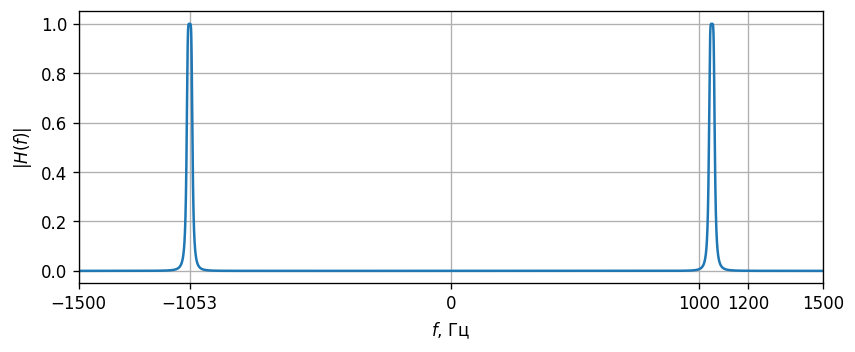

In [ ]:
N = 3
Wn = 1053
print (fs)
beta, alpha = signal.butter(N, Wn=[Wn - 10, Wn + 10], btype='bandpass', analog=False, output='ba', fs=rate)
plt.figure(figsize=[8, 3], dpi=120)
f, H = signal.freqz(beta, alpha, worN=np.linspace(-rate/2, rate/2, 1024**2), fs=rate)
plt.plot(f, (abs(H)))
plt.xlim([-fs/2, fs/2])
plt.xticks([-fs/2, -Wn, 0, f1, f2, fs/2])
plt.xlabel("$f$, Гц")
plt.ylabel("$|H(f)|$")

plt.grid()





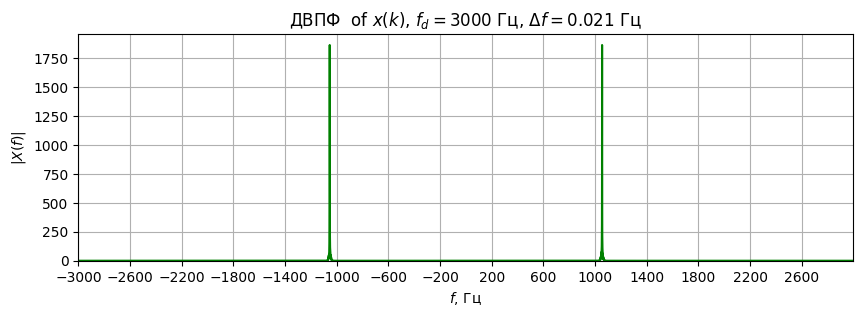

In [ ]:

output=signal.lfilter(beta, alpha, x)



plt.figure(figsize=[10, 3], dpi=100)
M = len (x1)
plt.plot((-0.5 + (np.arange(M) / M)) * rate, 
         abs (np.fft.fftshift (np.fft.fft (output))) / M, 
         'g')
plt.axis(xmin = -fs, xmax = fs, ymin=0)
plt.xticks([k for k in range (-fs, fs, 400)])

plt.title(u'ДВПФ  of $x(k)$, $f_d=%d$ Гц, $\Delta f=%.3f$ Гц' %(fs, fs/M))
plt.xlabel(u'$f$, Гц')
plt.ylabel(u'$|X(f)|$')
plt.grid()


output = output.astype('int16')

In [ ]:

scipy.io.wavfile.write(filename='./track.wav', rate=rate, data=output)
Audio('./track.wav')
